In [1]:
import os 
import re
import glob
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

# from kinetic_analysis.analysis.analysis_track import (fit_function,
#                               read_csv_file, 
#                               read_csv_file_v2,
#                               single_track_analysis,
#                               autocorrelation,
#                               fit_autocorrelation,
#                               fit_autocorrelation_v2,
#                               check_continuous_time,
#                               calculate_MSD,
#                              )

In [6]:
execfile("/home/u2175049/Documents/Code/KineticAnalysis/kinetic_analysis/analysis/analysis_track.py")
execfile("/home/u2175049/Documents/Code/KineticAnalysis/kinetic_analysis/utils/utils.py")

In [11]:
%pdb

Automatic pdb calling has been turned ON


In [3]:
PROTEIN_SIZE = 1200
DELTA_T = 0.97
delta_t_dir = {"4":3.97, "1":0.97, "0.7":0.7, "0.4":0.4, "0.3":0.3, "0.2":0.2}

In [5]:
directory = "/mnt/sda1/Sophie/2-KineticAnalysisData/2-Datas/03-Dropbox/tracking LLS_04_30/"
directory = "/mnt/sda1/Dropbox/TRANSLATION kinetic/Tracks for Sophie/"
files = os.listdir(directory)
files

['Synthetic tracks.csv', 'In vivo tracks.csv']

In [21]:
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_t", "err_c", "MSD"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]

for f in files:
    if "interval" in f:
        print(f)
        DELTA_T = float(f.split("interval ")[-1].split("sec")[0])
        print(DELTA_T)
        try:
            datas = read_csv_file(directory+f, sep=";")
        except:
            datas = read_csv_file(directory+f, sep=",")
            
        datas['X'] = pd.to_numeric(datas["POSITION_X"])
        datas['Y'] = pd.to_numeric(datas["POSITION_Y"])
        datas['Z'] = pd.to_numeric(datas["POSITION_Z"])
        
        for id_track in np.unique(datas['TRACK_ID']):

            (x, 
             y, 
             x_auto, 
             y_auto, 
             elongation_r, 
             translation_init_r,
             perr) = single_track_analysis(datas, 
                                         id_track, 
                                         delta_t = DELTA_T,
                                         protein_size=PROTEIN_SIZE,
                                         normalise_intensity=1,
                                         normalize_auto=True,
                                         mm=None,
                                         lowpass_=False,
                                         cutoff=100,
                                         rtol=1e-1,
                                         method="original",
                                         force_analysis=True,
                                         first_dot=True)

            MSDs = calculate_MSD(x = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['X'].values,
                                 y = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Y'].values,
                                 z = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Z'].values)

            if elongation_r>5:
                d = pd.DataFrame.from_dict({"file_name":f,
                                            'track_id':id_track,
                                            'len_track': len(x),
                                            'elongation_time':elongation_r,
                                            'init_translation_rate':translation_init_r,
                                           "err_t": perr[0], 
                                            "err_c":perr[1],
                                           "MSD":np.sum(MSDs)},
                                           orient='index').T
                result = pd.concat([result, d], ignore_index=True)


        result['tmp'] = 1
        result[["track_id","len_track","elongation_time","init_translation_rate"]].mean()

Exp 509 export (frame interval 3.47 sec).csv
3.47
to fix
original method
to fix
original method
to fix
original method
original method
original method
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
Exp 512 expor

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py

not fix
force analysis
original method
original method
to fix
original method
to fix
original method
to fix
original method
Exp 509 export (frame interval 5.3sec).csv
5.3
not fix
force analysis
original method
to fix
original method
to fix
original method
Exp 508 export (frame interval 5.89 sec).csv
5.89
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
Exp 508 export (frame interval 3.30 sec).csv
3.3
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
orig

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py

to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
Exp 510 export (frame interval 3.97 sec).csv
3.97
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original meth

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py

In [22]:
result.to_csv(directory+"result_original.csv")

In [30]:
result.groupby("file_name").mean()

,track_id,len_track,elongation_time,init_translation_rate,err_t,err_c,MSD,tmp
file_name,,,,,,,,
Exp 507 export (frame interval 3.10 sec).csv,139.291667,42.041667,355.324419,5.4758,inf,inf,11.874202,1.0
Exp 508 export (frame interval 3.30 sec).csv,103.842105,43.684211,218.966983,5.156423,inf,inf,7.053115,1.0
Exp 508 export (frame interval 5.89 sec).csv,220.692308,50.153846,169.888332,5.721486,inf,inf,14.046607,1.0
Exp 509 export (frame interval 3.47 sec).csv,722.027027,63.675676,274.313854,3.806005,inf,inf,16.259749,1.0
Exp 509 export (frame interval 5.3sec).csv,31.666667,108.666667,87.881305,2.661803,20.292763,1.692807,12.22773,1.0
Exp 510 export (frame interval 3.97 sec).csv,151.294118,38.529412,189.097917,10.052518,inf,inf,4.296139,1.0
Exp 512 export (frame interval 3.56 sec).csv,101.166667,35.5,209.458233,12.39046,inf,inf,9.818656,1.0


<Axes: title={'center': 'init_translation_rate'}, xlabel='file_name'>

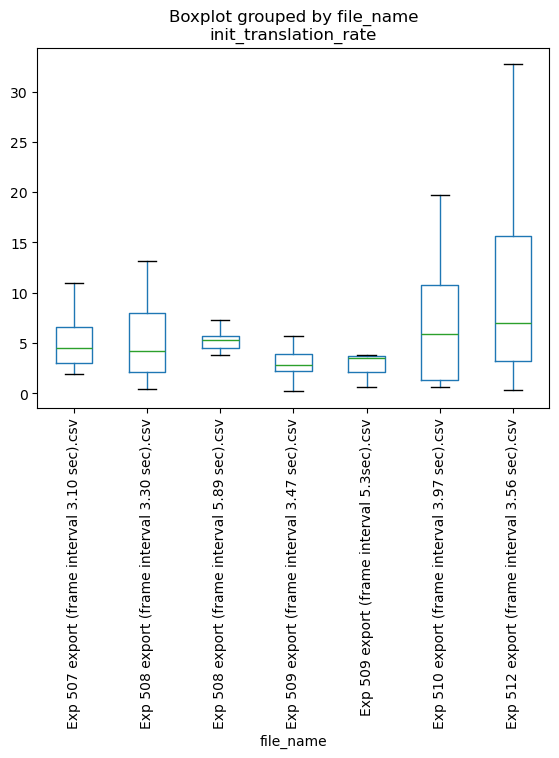

In [24]:
fig, ax = plt.subplots()
result.boxplot(column="init_translation_rate", 
               by="file_name", 
               grid = False,
               showfliers = False,
               ax= ax, 
               rot=90)

<Axes: title={'center': 'elongation_time'}, xlabel='file_name'>

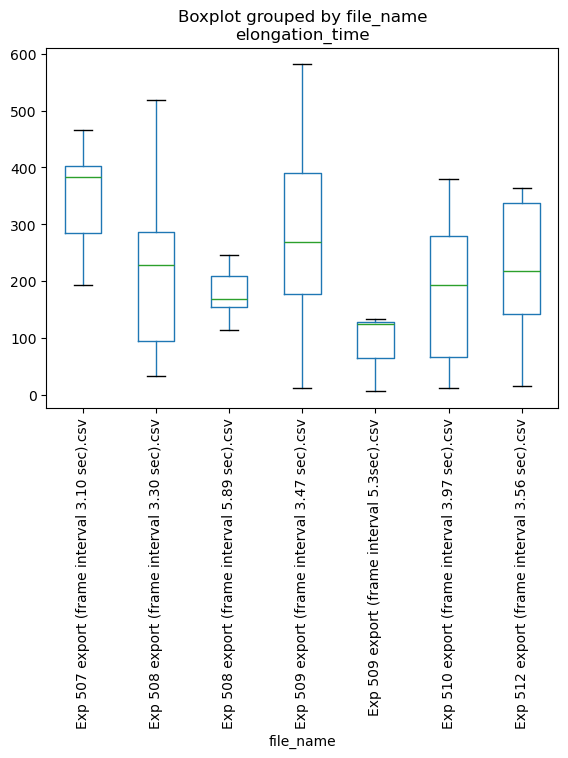

In [25]:
fig, ax = plt.subplots()
result.boxplot(column="elongation_time", 
               by="file_name", 
               grid = False,
               showfliers = False,
               ax= ax, 
               rot=90)

# Plot track

Exp 509 export (frame interval 3.47 sec).csv
3.47
to fix
original method
to fix
to fix
original method
to fix
to fix
original method
to fix
original method
original method


/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


original method
to fix
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
original method
to fix
original method
to fix
to fix
original method
not fix
original method
to fix
original method
not fix
to fix
original method
to fix
to fix
original method
not fix
to fix
original method
not fix
to fix
original method
not fix
to fix
original method
to fix
not fix
force analysis
original method
not fix


/tmp/ipykernel_27335/2908814522.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2,1)


not fix
force analysis
original method
not fix
original method
to fix
original method
not fix
to fix
original method
to fix
to fix
original method
to fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
not fix
to fix
original method
not fix
to fix
original method
to fix
to fix
original method
to fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
Exp 512 export (frame interval 3.56 sec).csv
3.56
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix


/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
original method
to fix
original method
to fix
to fix
original method
not fix
to fix
original method
not fix
Exp 509 export (frame interval 5.3sec).csv
5.3
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
not fix
Exp 508 export (frame interval 5.89 sec).csv
5.89
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
to fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
to fix
to fix
original method
to fix


/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


to fix
original method
to fix
original method
to fix
original method
to fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
truncated tracks tests (frame interval 1 sec).csv
1.0
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
f

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


to fix
original method
not fix
to fix
original method
to fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
to fix
to fix
original method
to fix
to fix
original method
not fix
Exp 507 export (frame interval 3.10 sec).csv
3.1
original method
to fix
original method
to fix
to fix
original method


/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


to fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
to fix
to fix
original method
to fix
Exp 510 export (frame interval 3.97 sec).csv
3.97
not fix
force analysis
original method
not fix
to fix
original method
not fix
to fix
original method
n

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


not fix
force analysis
original method
not fix
to fix
original method
to fix
to fix
original method
to fix
to fix
original method
not fix
to fix
original method
to fix
original method
to fix
original method
to fix


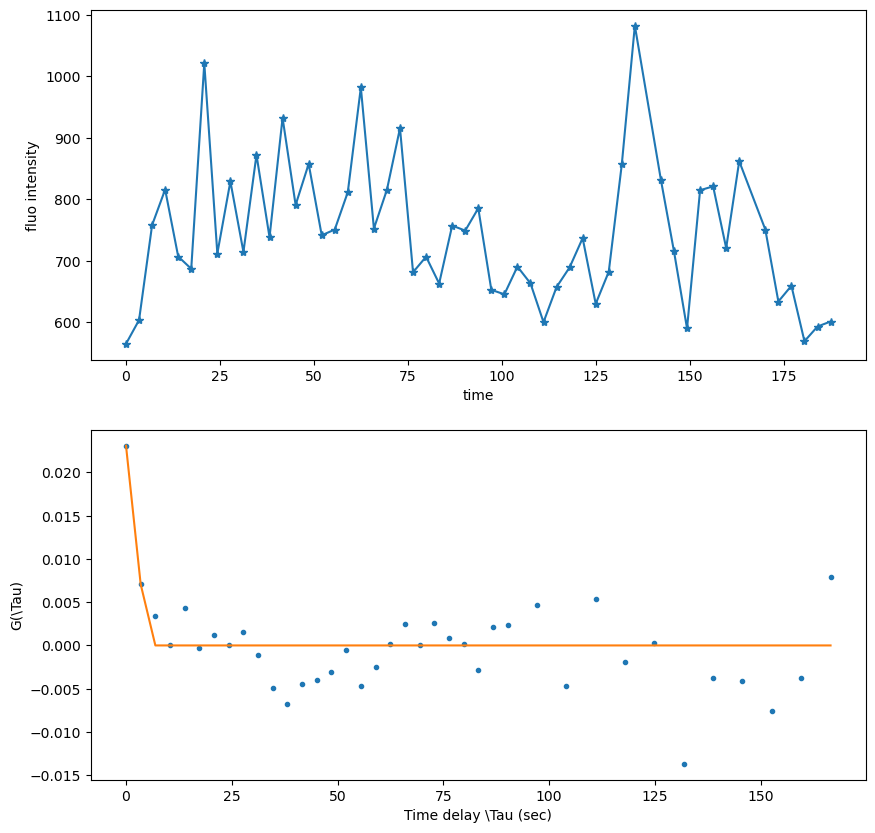

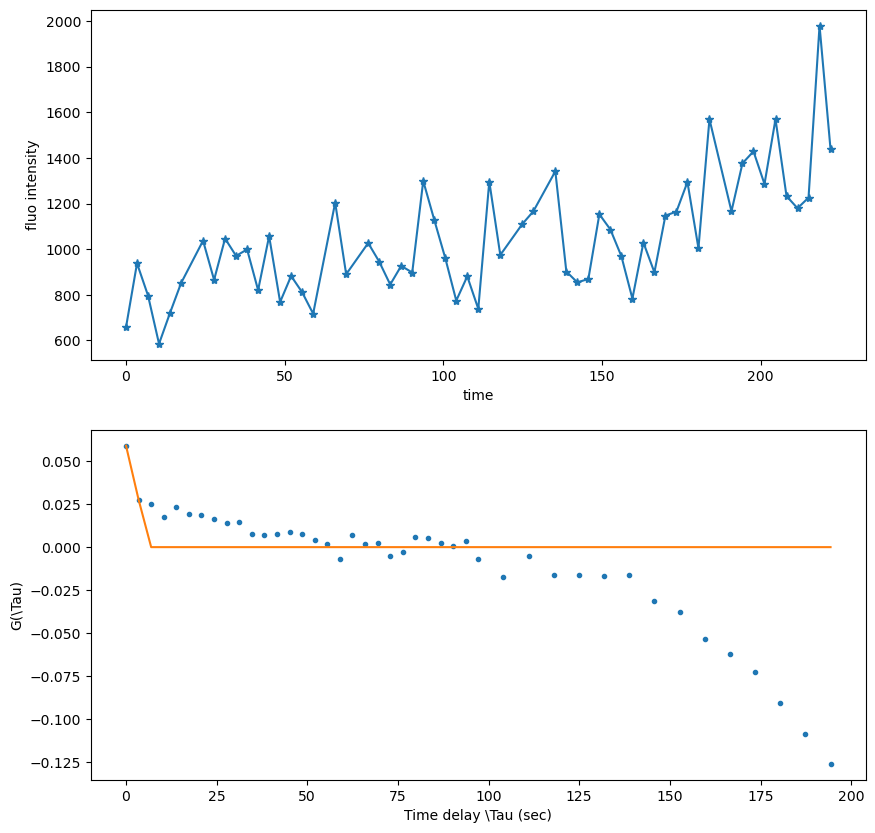

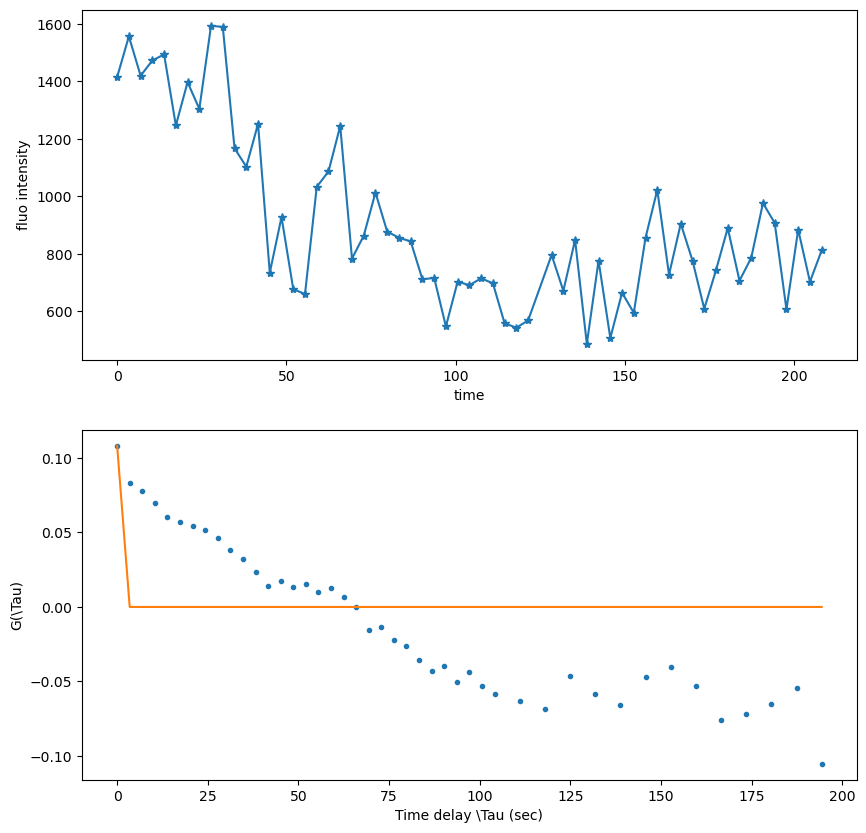

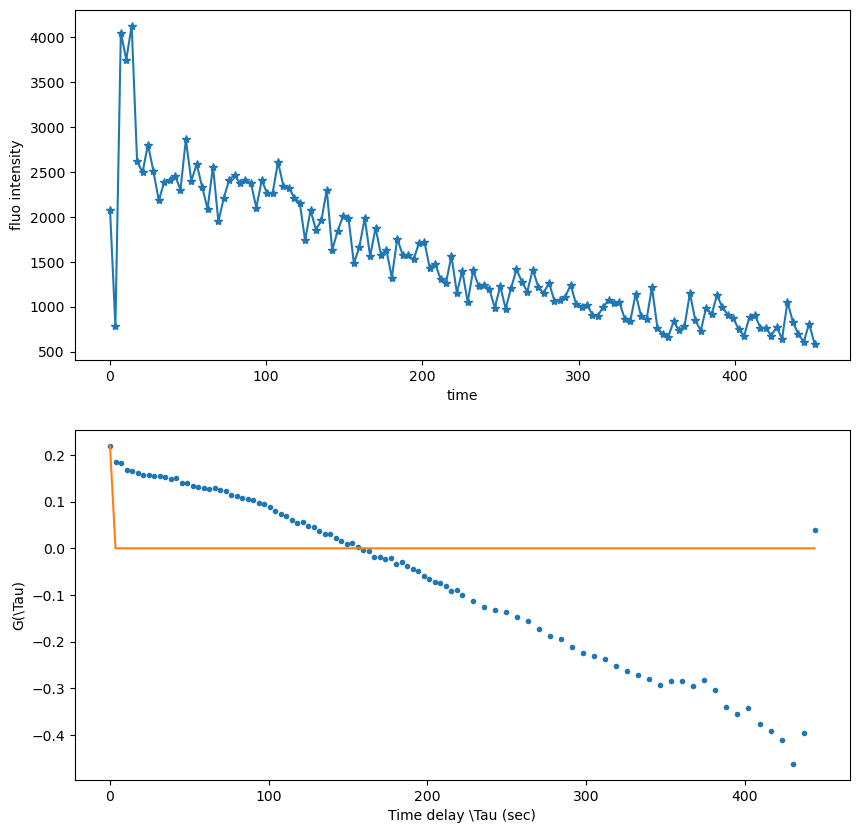

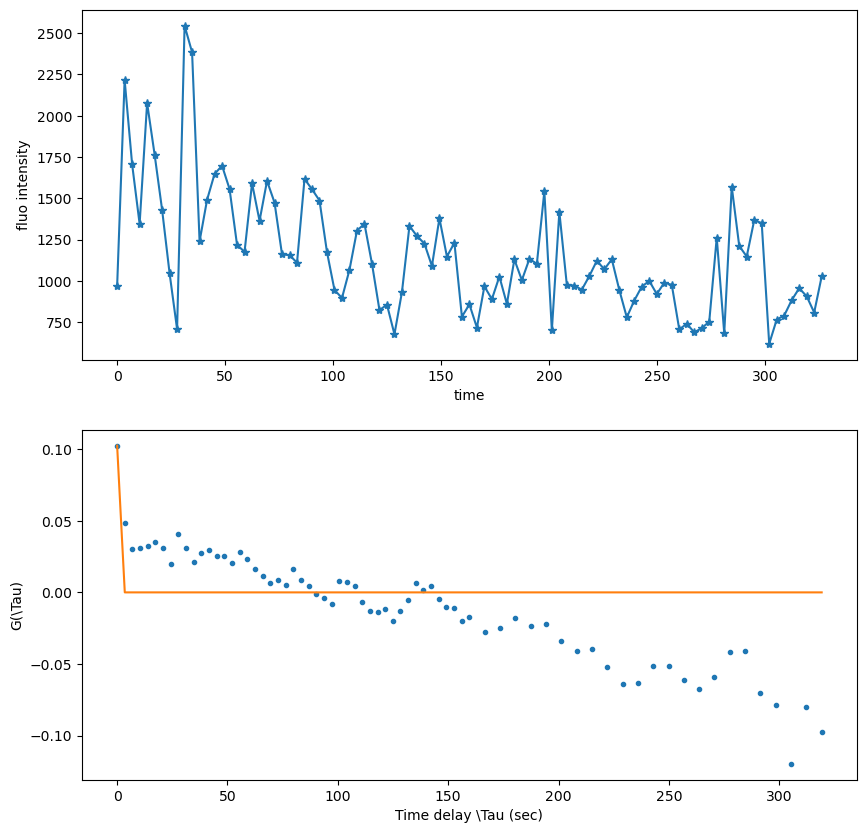

...

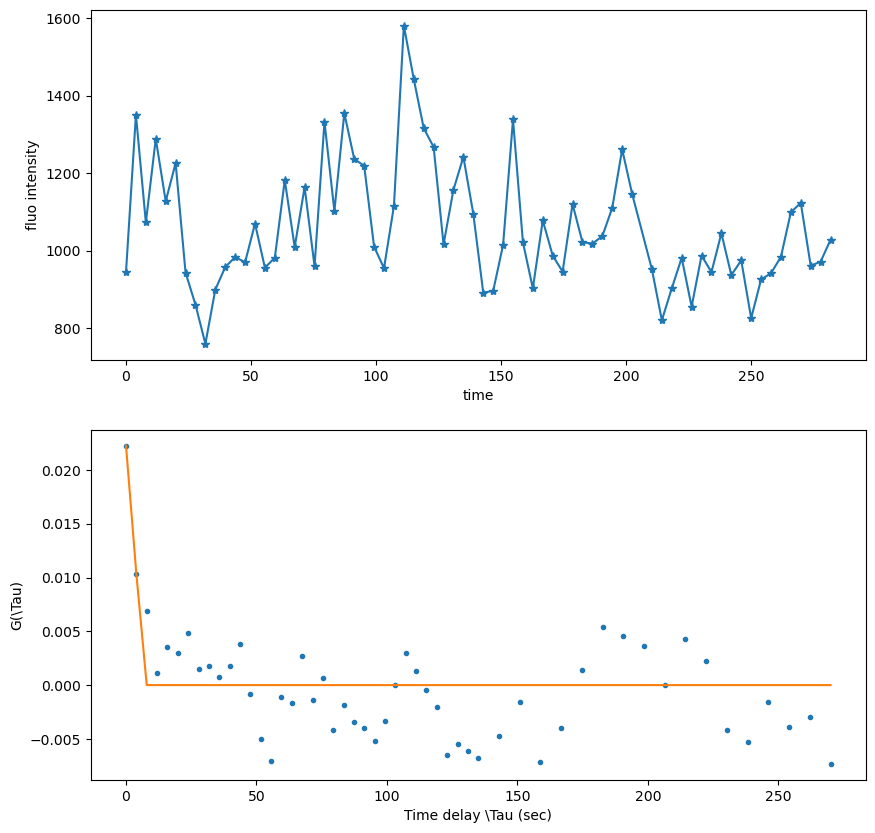

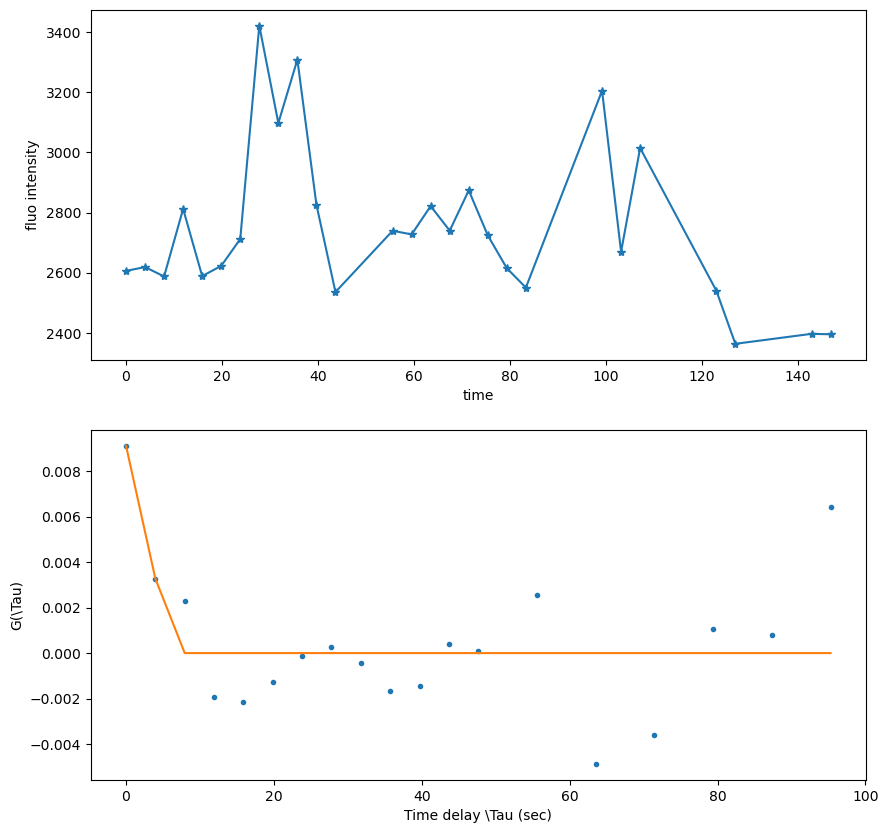

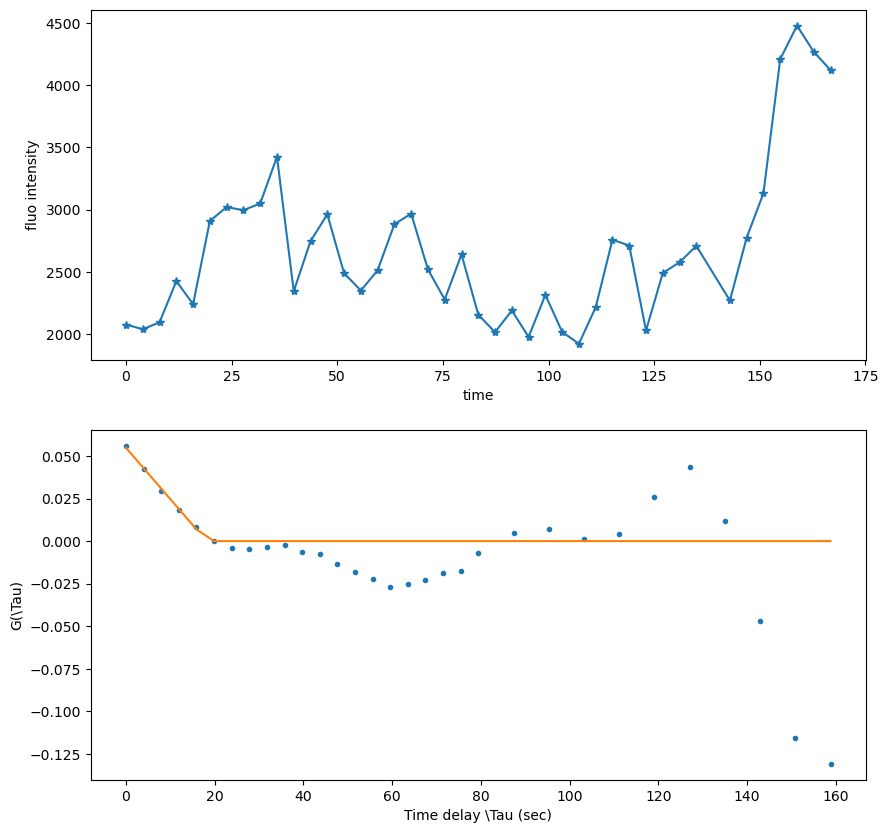

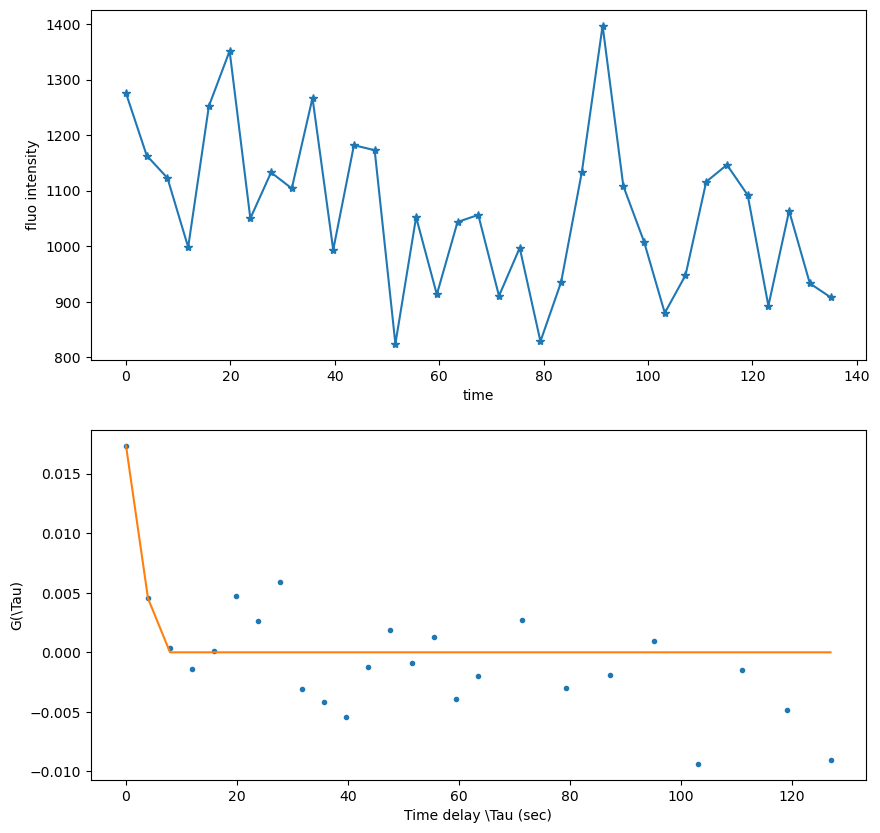

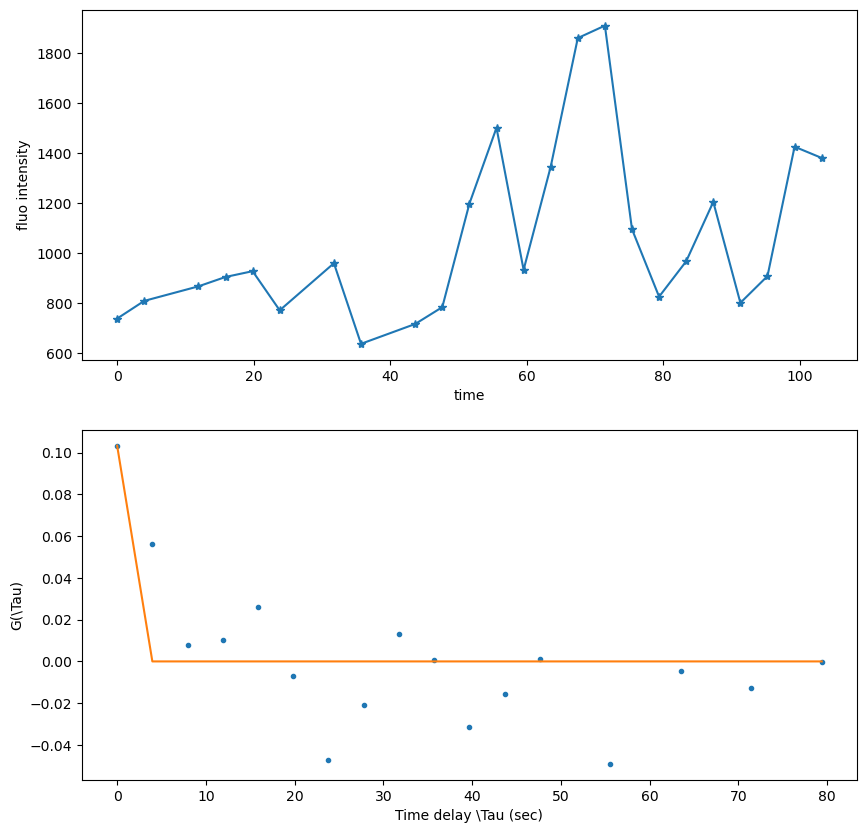

In [19]:
rtol=1e-5
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_t", "err_c", "MSD"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]

for f in files:
    if "interval" in f:
        try:
            os.mkdir(f[:-4])
        except:
            pass
        print(f)
        DELTA_T = float(f.split("interval ")[-1].split("sec")[0])
        print(DELTA_T)
        try:
            datas = read_csv_file(directory+f, sep=";")
        except:
            datas = read_csv_file(directory+f, sep=",")
            
        datas['X'] = pd.to_numeric(datas["POSITION_X"])
        datas['Y'] = pd.to_numeric(datas["POSITION_Y"])
        datas['Z'] = pd.to_numeric(datas["POSITION_Z"])
        
        for id_track in np.unique(datas['TRACK_ID']):
            (x, 
             y, 
             x_auto, 
             y_auto, 
             elongation_r, 
             translation_init_r,
             perr) = single_track_analysis(datas, 
                                         id_track, 
                                         delta_t = DELTA_T,
                                         protein_size=PROTEIN_SIZE,
                                         normalise_intensity=1,
                                         normalize_auto=True,
                                         mm=None,
                                         lowpass_=False,
                                         cutoff=100,
                                         rtol=1e-1,
                                         method="original",
                                         force_analysis=True,
                                         first_dot=True)

            normalise_intensity=1
            x = (datas[datas.TRACK_ID == id_track].sort_values('FRAME')['FRAME'].values -
                 min(datas[datas.TRACK_ID == id_track].sort_values('FRAME')['FRAME'].values))*DELTA_T
            y = (datas[datas.TRACK_ID == id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values / normalise_intensity)

            if not check_continuous_time(x, DELTA_T, rtol=rtol):
                times_diff = np.diff(x)[np.where(np.isclose(np.diff(x), DELTA_T, rtol=rtol) == False)]
                if (times_diff < 3 * DELTA_T).all():
                    print("to fix")
                    i=0
                    while i < (len(x)-1):
                        if np.round(x[i]-x[i+1], decimals=2)>DELTA_T:
                            x = x[:i+1] + [(x[i]+x[i+1])/2] + x[i+1:]
                        i+=1
                else:
                    print("not fix")


            if x is not np.nan:
                fig, ax = plt.subplots(2,1)
                ax[0].plot(x,y, "*-")
                ax[0].set_xlabel("time")
                ax[0].set_ylabel("fluo intensity")

                ax[1].plot(x_auto, y_auto, '.')
                ax[1].plot(x_auto, fit_function(x_auto, PROTEIN_SIZE/elongation_r, translation_init_r) )
                ax[1].set_xlabel("Time delay \Tau (sec)")
                ax[1].set_ylabel("G(\Tau)")
                fig.set_size_inches((10,10))
                fig.savefig(f[:-4]+"/"+str(id_track)+".png")

# Result truncated

In [13]:
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_t", "err_c", "MSD"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]

f = "truncated tracks tests (frame interval 1 sec).csv"
if "interval" in f:
    print(f)
    DELTA_T = float(f.split("interval ")[-1].split("sec")[0])
    print(DELTA_T)
    
    datas = read_csv_file(directory+f, sep=";")
    

    datas['X'] = pd.to_numeric(datas["POSITION_X"])
    datas['Y'] = pd.to_numeric(datas["POSITION_Y"])
    datas['Z'] = pd.to_numeric(datas["POSITION_Z"])

    for id_track in np.unique(datas['TRACK_ID']):

        (x, 
         y, 
         x_auto, 
         y_auto, 
         elongation_r, 
         translation_init_r,
         perr) = single_track_analysis(datas, 
                                     id_track, 
                                     delta_t = DELTA_T,
                                     protein_size=PROTEIN_SIZE,
                                     normalise_intensity=1,
                                     normalize_auto=True,
                                     mm=None,
                                     lowpass_=False,
                                     cutoff=100,
                                     rtol=1e-1,
                                     method="linear",
                                     force_analysis=True,
                                     first_dot=True)

        MSDs = calculate_MSD(x = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['X'].values,
                             y = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Y'].values,
                             z = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Z'].values)

        if elongation_r>5:
            d = pd.DataFrame.from_dict({"file_name":f,
                                        'track_id':id_track,
                                        'len_track': len(x),
                                        'elongation_time':elongation_r,
                                        'init_translation_rate':translation_init_r,
                                       "err_t": perr[0], 
                                        "err_c":perr[1],
                                       "MSD":np.sum(MSDs)},
                                       orient='index').T
            result = pd.concat([result, d], ignore_index=True)


    result['tmp'] = 1
#     result[["track_id","len_track","elongation_time","init_translation_rate"]].mean()

truncated tracks tests (frame interval 1 sec).csv
1.0
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysis
linear method
not fix
force analysi

In [14]:
result.to_csv(directory+"result_truncated_linear.csv")

In [15]:
result

,file_name,track_id,len_track,elongation_time,init_translation_rate,err_t,err_c,MSD,tmp
0,truncated tracks tests (frame interval 1 sec).csv,32,175,20.338983,0.179476,-1,-1,2.772922,1
1,truncated tracks tests (frame interval 1 sec).csv,32-10,165,21.818182,0.193436,-1,-1,2.678703,1
2,truncated tracks tests (frame interval 1 sec).csv,32-15,160,22.222222,0.195041,-1,-1,2.628978,1
3,truncated tracks tests (frame interval 1 sec).csv,32-20,155,23.076923,0.203515,-1,-1,2.538691,1
4,truncated tracks tests (frame interval 1 sec).csv,32-25,150,23.529412,0.201918,-1,-1,2.509162,1
5,truncated tracks tests (frame interval 1 sec).csv,32-30,145,24.0,0.210979,-1,-1,2.517584,1
6,truncated tracks tests (frame interval 1 sec).csv,32-35,140,25.0,0.226001,-1,-1,2.315181,1
7,truncated tracks tests (frame interval 1 sec).csv,32-40,135,26.086957,0.243192,-1,-1,2.45806,1
8,truncated tracks tests (frame interval 1 sec).csv,32-45,130,26.666667,0.24383,-1,-1,2.502238,1
9,truncated tracks tests (frame interval 1 sec).csv,32-5,170,21.052632,0.194695,-1,-1,2.716644,1


In [20]:
result = pd.DataFrame(columns=["track_id", "mean_x", "mean_intensity", "std_intensity"])
i = 0
for id_track in np.unique(datas.TRACK_ID):
    new_row = {"track_id":id_track,
               "mean_x":datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Y'].mean(),
               "mean_intensity":(datas[datas.TRACK_ID == id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values).mean(),
               "std_intensity":(datas[datas.TRACK_ID == id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values).std()}
    result.loc[i] = new_row
    i+=1
    


KeyError: 'Y'

> /home/u2175049/anaconda3/lib/python3.11/site-packages/pandas/core/indexes/base.py(3798)get_loc()
   3796             ):
   3797                 raise InvalidIndexError(key)
-> 3798             raise KeyError(key) from err
   3799         except TypeError:
   3800             # If we have a listlike key, _check_indexing_error will raise

ipdb> c


NameError: name 'csv' is not defined

> /tmp/ipykernel_372503/3023712515.py(8)<module>()
      4 ax.errorbar(result["mean_x"],result["mean_intensity"], result["std_intensity"], fmt='none', c="grey", alpha=1)
      5 ax.set_xlabel("Mean position Y-axis")
      6 ax.set_ylabel("Mean intensity")
      7 # ax.set_xlim(15,39)
----> 8 _ = ax.set_title(csv.split('/')[-1], fontsize=8 )

ipdb> c


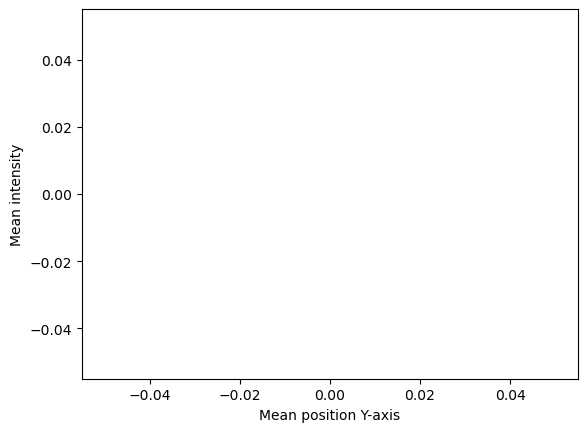

In [21]:
fig, ax = plt.subplots()

ax.scatter(result["mean_x"],result["mean_intensity"], c="black")
ax.errorbar(result["mean_x"],result["mean_intensity"], result["std_intensity"], fmt='none', c="grey", alpha=1)
ax.set_xlabel("Mean position Y-axis")
ax.set_ylabel("Mean intensity")
# ax.set_xlim(15,39)
_ = ax.set_title(csv.split('/')[-1], fontsize=8 )

0.0007

# plot all track that was keep in result table

In [22]:

PROTEIN_SIZE = 1200

In [23]:
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_t", "err_c", "MSD"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]

DELTA_T = 1.9
list_csv = glob.glob(directory+paths[3]+"/*.csv")
for csv in list_csv:
    if re.search("^(?!.*result).*$", csv,):
        
        datas = read_csv_file_v2(csv, sep=",")
        datas.rename({"TRACK ID":"TRACK_ID",
                     "T":"POSITION_T",
                     "MEAN INTENSITY CH1":"MEAN_INTENSITY_CH1"}, 
                     axis=1, 
                     inplace=True)




        for id_track in np.unique(datas['TRACK_ID']):

            (x, 
             y, 
             x_auto, 
             y_auto, 
             elongation_r, 
             translation_init_r,
             perr) = single_track_analysis(datas, 
                                         id_track, 
                                         delta_t = DELTA_T,
                                         protein_size=PROTEIN_SIZE,
                                         normalise_intensity=1,
                                         normalize_auto=True,
                                         mm=None,
                                         lowpass_=False,
                                         cutoff=100,
                                         rtol=1e-1,
                                         method="original",
                                         force_analysis=True,
                                         first_dot=True)

            MSDs = calculate_MSD(x = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['X'].values,
                                 y = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Y'].values,
                                 z = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Z'].values)

            if elongation_r>5:
                d = pd.DataFrame.from_dict({"file_name":"",
                                            'track_id':id_track,
                                            'len_track': len(x),
                                            'elongation_time':elongation_r,
                                            'init_translation_rate':translation_init_r,
                                           "err_t": perr[0], 
                                            "err_c":perr[1],
                                           "MSD":np.sum(MSDs)},
                                           orient='index').T
                result = pd.concat([result, d], ignore_index=True)


        result['tmp'] = 1
        result[["track_id","len_track","elongation_time","init_translation_rate"]].mean()

In [24]:
result.to_csv(csv[:-4]+"_result.csv")
# result[(result["MSD"]<2)].to_csv((files[0][:-4]+"_result_filter_MSD2.csv"))

NameError: name 'csv' is not defined

> /tmp/ipykernel_372503/3683791319.py(1)<module>()
----> 1 result.to_csv(csv[:-4]+"_result.csv")
      2 # result[(result["MSD"]<2)].to_csv((files[0][:-4]+"_result_filter_MSD2.csv"))

ipdb> c


In [213]:
result.sort_values("track_id")

,file_name,track_id,len_track,elongation_time,init_translation_rate,err_t,err_c,MSD,tmp
0,,0,132,31.726261,2.912166,5.455597,0.412516,0.360352,1
1,,1,167,38.411772,2.249933,4.471701,0.326322,0.395867,1
2,,2,224,15.79499,8.126159,11.118142,1.193287,0.207695,1
3,,3,31,454.098993,274.614284,1.317846,128.231072,0.042969,1
4,,4,222,45.110298,2.413259,4.915633,0.44786,0.510992,1
5,,5,224,733.118076,344.321757,0.483232,95.739934,0.18896,1
6,,6,80,55.292044,10.828158,5.798441,2.917496,0.187319,1
7,,7,27,1043.960522,311.497176,0.427654,138.969241,0.037372,1
8,,8,155,28.544688,2.826929,5.24895,0.354884,0.158035,1
9,,10,160,423.280749,93.117165,0.593431,17.501949,0.278605,1


not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
ori

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
forc

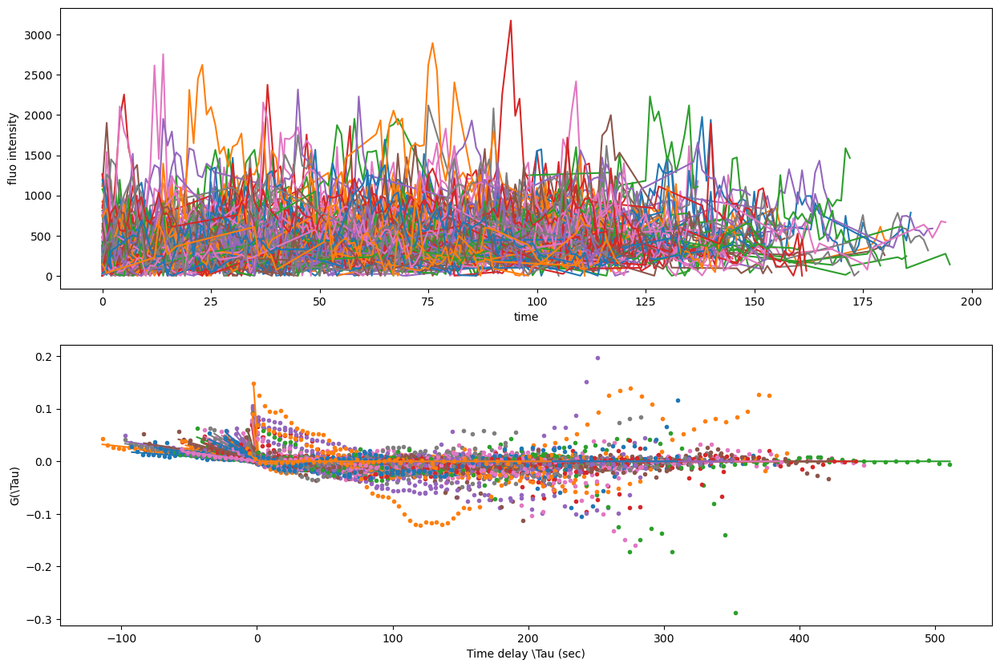

In [66]:
import matplotlib.colors as mcolors
fig, ax = plt.subplots(2,1)

colors = list(mcolors.TABLEAU_COLORS.keys())

i=0
for id_track in np.unique(result['track_id']):#[:5]:
# for id_track in [10,710,3021,7,16,8010,5471]:
# for id_track in [9353,19,5756,2881,11,6592,2092,1512,1754,6495,3108,1129,6350]:

    x = datas[datas.TRACK_ID==id_track].sort_values('FRAME')['POSITION_T'].values-min(datas[datas.TRACK_ID==id_track].sort_values('FRAME')['POSITION_T'].values)
    y = datas[datas.TRACK_ID==id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values-np.min(datas[datas.TRACK_ID==id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values)
    
    if len(x)>50:
        ax[0].plot(x, y, color=colors[i])


        (x, 
         y, 
         x_auto, 
         y_auto, 
         elongation_r, 
         translation_init_r,
         perr) = single_track_analysis(datas, 
                                     id_track, 
                                     delta_t = DELTA_T,
                                     protein_size=PROTEIN_SIZE,
                                     normalise_intensity=1,
                                     normalize_auto=True,
                                     mm=None,
                                     lowpass_=False,
                                     cutoff=100,
                                     rtol=1e-5,
                                     method="original",
                                     force_analysis=True,
                                     first_dot=True)


        ax[1].plot(x_auto-PROTEIN_SIZE/elongation_r, 
                   y_auto, 
                   '.', 
                   color=colors[i])
        ax[1].plot(x_auto-PROTEIN_SIZE/elongation_r, 
                   fit_function(x_auto, PROTEIN_SIZE/elongation_r, translation_init_r ), 
                   color=colors[i] )



        if i == 7:
            i=0
        else:
            i+=1

ax[0].set_xlabel("time")
ax[0].set_ylabel("fluo intensity")
ax[1].set_xlabel("Time delay \Tau (sec)")
ax[1].set_ylabel("G(\Tau)")
# ax[1].set_ylim(-0.002, 0.002)


fig.set_size_inches((15,10))
# print(len(np.unique(result['track_id'])))

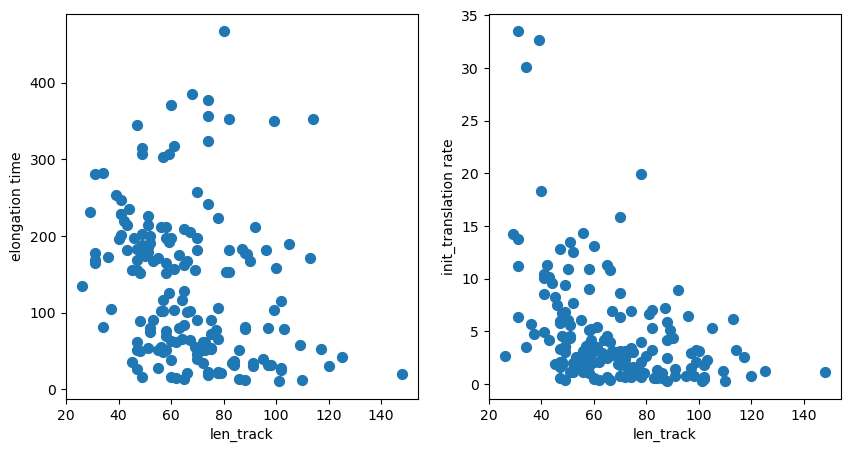

In [67]:
fig, ax = plt.subplots(1, 2)
ax[0].scatter(result['len_track'], result['elongation_time'], s=50)
ax[1].scatter(result['len_track'], result['init_translation_rate'], s=50)
ax[0].set_xlabel('len_track')
ax[0].set_ylabel('elongation time')

ax[1].set_xlabel('len_track')
ax[1].set_ylabel('init_translation rate')
fig.set_size_inches((10,5))

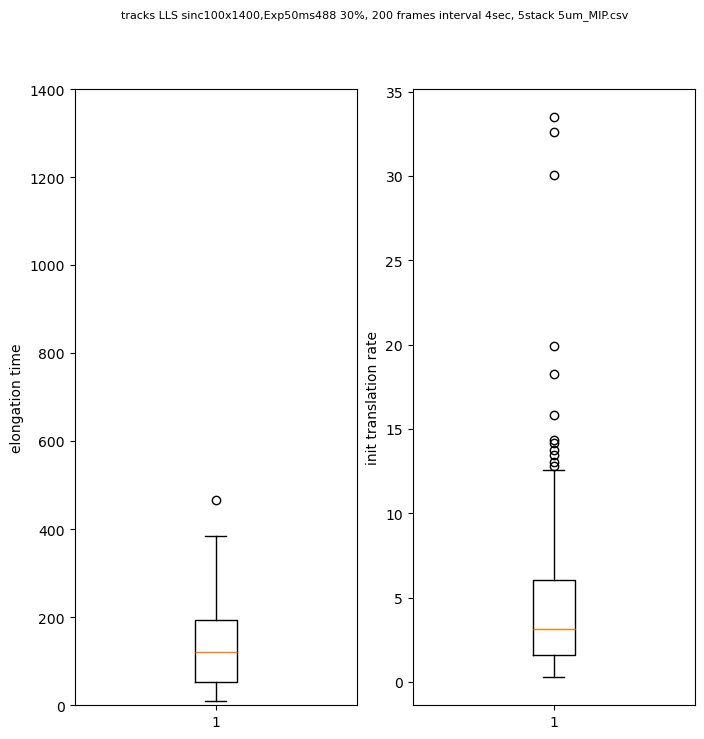

In [68]:
fig, ax = plt.subplots(1, 2)
ax[0].boxplot(result['elongation_time'].to_numpy())
ax[1].boxplot(result['init_translation_rate'].to_numpy())
ax[0].set_ylabel('elongation time')
ax[1].set_ylabel('init translation rate')
fig.set_size_inches((8,8))
ax[0].set_ylim(0,1400)

_ = fig.suptitle(files[0], fontsize=8 )

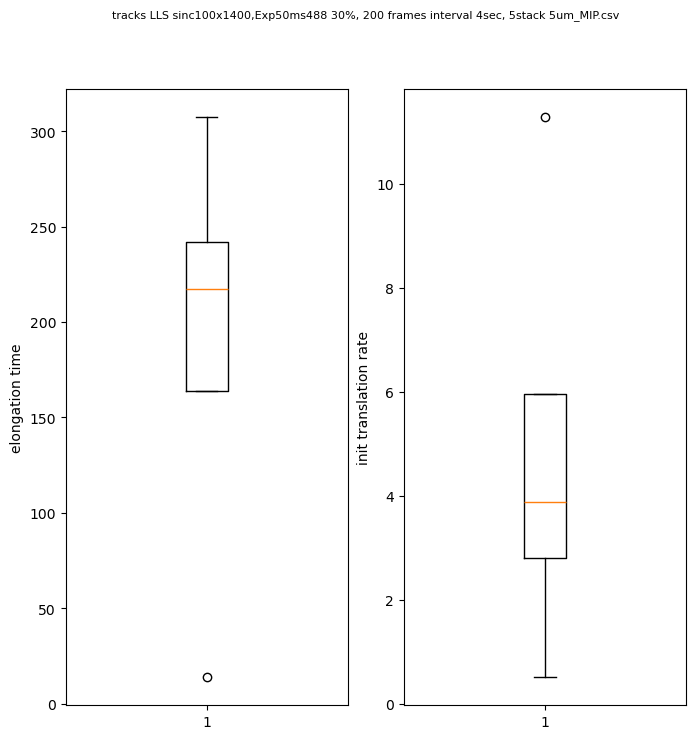

In [69]:

fig, ax = plt.subplots(1, 2)
ax[0].boxplot(result[(result["MSD"]<2) ]['elongation_time'].to_numpy())
ax[1].boxplot(result[(result["MSD"]<2)]['init_translation_rate'].to_numpy())
ax[0].set_ylabel('elongation time')
ax[1].set_ylabel('init translation rate')
fig.set_size_inches((8,8))
# ax[0].set_ylim(0,1400)

_ = fig.suptitle(files[0], fontsize=8 )

# Multiple file analysis

In [25]:
DELTA_T = 0.02174573
PROTEIN_SIZE = 1200

In [27]:
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_c", "err_t"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]
for f in files:
    f = path+f
    datas = read_csv_file(f)


    for id_track in np.unique(datas['TRACK_ID']): 
        (x, 
         y, 
         x_auto, 
         y_auto, 
         elongation_r, 
         translation_init_r,
         perr) = single_track_analysis(datas, 
                                                     id_track, 
                                                     delta_t = DELTA_T,
                                                     protein_size=PROTEIN_SIZE,
                                                     normalise_intensity=1,
                                                     normalize_auto=True,
                                                     mm=None,
                                                     lowpass_=False,
                                                     cutoff=100,
                                                     rtol=1e-5,
                                                     method="original",
                                                    force_analysis=False)

        
        if elongation_r>5:
            d = pd.DataFrame.from_dict({'file_name':f.split('/')[-1],
                                        'track_id':id_track,
                                        'len_track': len(x),
                                        'elongation_time':elongation_r,
                                        'init_translation_rate':translation_init_r,
                                        'init_translation_rate':translation_init_r,
                                   "err_t": perr[0], 
                                    "err_c":perr[1]},
                                       orient='index').T
            result = pd.concat([result, d], ignore_index=True)



result['tmp'] = 1
# result.drop(result[result["len_track"]<100].index, inplace=True)

to fix
original method
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method


In [28]:
# result.sort_values('len_track')
result

,file_name,track_id,len_track,elongation_time,init_translation_rate,err_c,err_t,tmp
0,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,7,205,1317.24221,1563.382287,383.676136,0.226613,1
1,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,10,267,633.313319,136.234798,15.446009,0.213499,1
2,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,11,118,2352.270614,1851.102152,930.985647,0.255902,1
3,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,16,192,1633.536754,1301.189145,262.813027,0.15015,1
4,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,19,149,2851.235216,5895.043257,2240.281541,0.158268,1
...,...,...,...,...,...,...,...,...
145,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,8351,117,2040.674423,1452.476147,236.143092,0.09331,1
146,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,8388,113,1003.350812,2437.363685,1177.003736,0.585206,1
147,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,9193,116,8438.89104,2994.762593,1116.157323,0.053371,1
148,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,9746,112,7209.024606,9351.532459,1396.917395,0.025486,1


In [29]:
result.to_csv("/mnt/sda1/Sophie/2-KineticAnalysisData/2-Datas/02-Pierre/analysis.csv")

track_id                  4032.125000
len_track                  150.625000
elongation_time          19482.804586
init_translation_rate    58660.438013
tmp                          1.000000
dtype: float64


/tmp/ipykernel_366698/2862878632.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(result.mean())


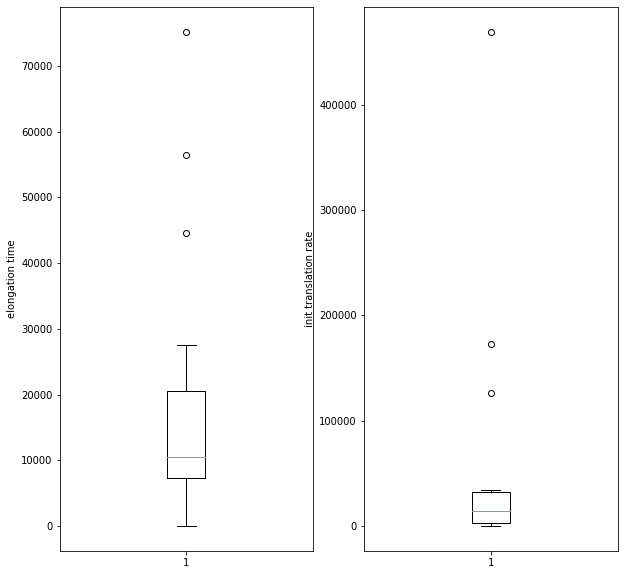

In [195]:
fig, ax = plt.subplots(1, 2)
ax[0].boxplot(result['elongation_time'])
ax[1].boxplot(result['init_translation_rate'])
ax[0].set_ylabel('elongation time')
ax[1].set_ylabel('init translation rate')
fig.set_size_inches((10,10))
print(result.mean())

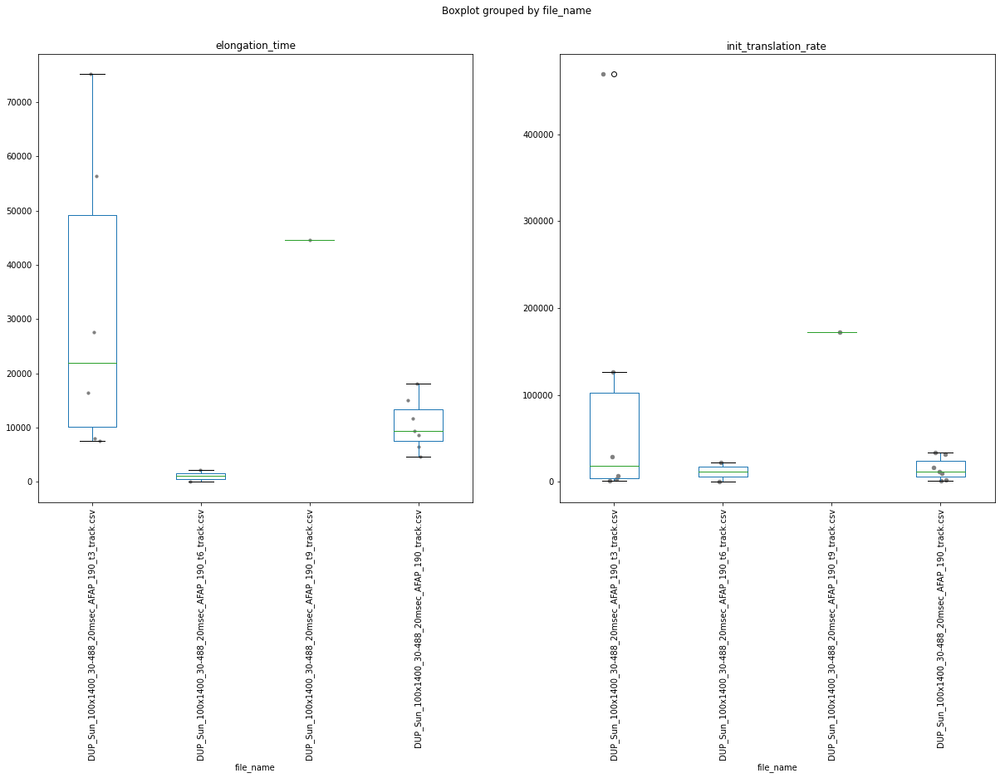

In [196]:
# result['elongation_time'] = pd.to_numeric(result['elongation_time'])
fig, ax = plt.subplots(1,2)
result.boxplot(['elongation_time'] , 
               by='file_name', 
               grid=False, 
               ax = ax[0],
               rot=90, 
              )

result.boxplot([ 'init_translation_rate'] , 
               by='file_name', 
               grid=False, 
               ax = ax[1],
               rot=90
               )

group = 'file_name'
column = 'elongation_time'
grouped = result.groupby(group)
names, vals, xs = [], [] ,[]
for i, (name, subdf) in enumerate(grouped):
    names.append(name)
    vals.append(subdf[column].tolist())
    xs.append(np.random.normal(i+1, 0.04, subdf.shape[0]))
clevels = np.linspace(0., 1., len(grouped))
for x, val, clevel in zip(xs, vals, clevels):
    ax[0].scatter(x, val, c='grey', alpha=1, s=10)
    
    
group = 'file_name'
column = 'init_translation_rate'
grouped = result.groupby(group)
names, vals, xs = [], [] ,[]
for i, (name, subdf) in enumerate(grouped):
    names.append(name)
    vals.append(subdf[column].tolist())
    xs.append(np.random.normal(i+1, 0.04, subdf.shape[0]))
clevels = np.linspace(0., 1., len(grouped))
for x, val, clevel in zip(xs, vals, clevels):
    ax[1].scatter(x, val, c='grey', alpha=1, s=20)
    
# ax[1].set_ylim(0,250)
fig.set_size_inches((20,10))

In [197]:
result.groupby(by='file_name')[['len_track','elongation_time', 'init_translation_rate']].mean()

,len_track,elongation_time,init_translation_rate
file_name,,,
DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_track.csv,122.666667,31851.439123,105996.340208
DUP_Sun_100x1400_30-488_20msec_AFAP_190_t6_track.csv,114.500000,1067.004762,11317.624959
DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_track.csv,109.000000,44568.529603,172373.790806
DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,190.857143,10559.099929,15368.560890


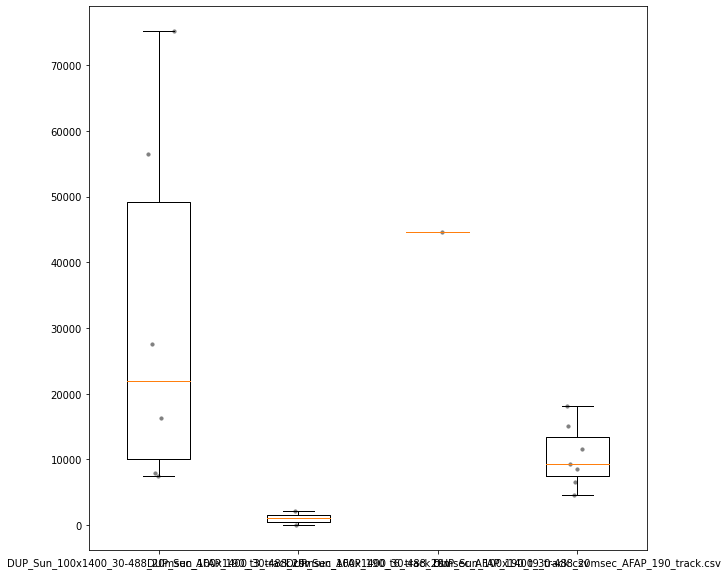

In [198]:
from matplotlib import cm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# initialize dataframe
# n = 200
# ngroup = 3
# df = pd.DataFrame({'data': np.random.rand(n), 'group': map(np.floor, np.random.rand(n) * ngroup)})
fig, ax = plt.subplots()

group = 'file_name'
column = 'elongation_time'
grouped = result.groupby(group)

names, vals, xs = [], [] ,[]

for i, (name, subdf) in enumerate(grouped):
    names.append(name)
    vals.append(subdf[column].tolist())
    xs.append(np.random.normal(i+1, 0.04, subdf.shape[0]))

ax.boxplot(vals, labels=names, )
ngroup = len(vals)



for x, val, clevel in zip(xs, vals, clevels):
    ax.scatter(x, val, c='grey', alpha=1, s=10)
    
ax.grid(False)
fig.set_size_inches((10,10))

In [199]:
result[["file_name", 'len_track','elongation_time', 'init_translation_rate']]

,file_name,len_track,elongation_time,init_translation_rate
0,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,205,9318.07351,11914.330514
1,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,267,4580.418322,989.748806
2,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,192,11648.633438,9614.170446
3,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,201,6529.842023,2621.069846
4,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,150,8592.012892,16662.326354
5,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,161,18147.536132,31855.077786
6,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,160,15097.183184,33923.202475
7,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_tra...,122,27602.012523,7137.752191
8,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_tra...,164,7521.844156,726.496959
9,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_tra...,159,8002.205743,3564.989263


In [200]:
result[["file_name", 'len_track','elongation_time', 'init_translation_rate']].mean()

/tmp/ipykernel_366698/1952775797.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  result[["file_name", 'len_track','elongation_time', 'init_translation_rate']].mean()


len_track                  150.625000
elongation_time          19482.804586
init_translation_rate    58660.438013
dtype: float64

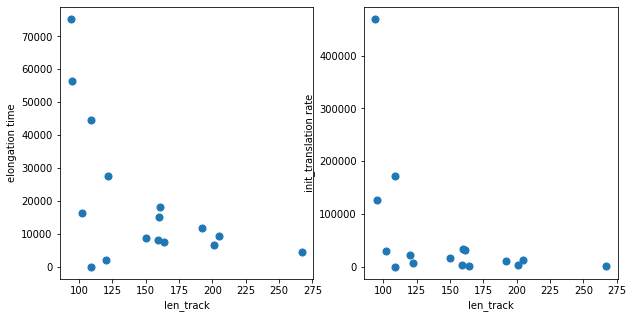

In [201]:
fig, ax = plt.subplots(1, 2)
ax[0].scatter(result['len_track'], result['elongation_time'], s=50)
ax[1].scatter(result['len_track'], result['init_translation_rate'], s=50)
ax[0].set_xlabel('len_track')
ax[0].set_ylabel('elongation time')

ax[1].set_xlabel('len_track')
ax[1].set_ylabel('init_translation rate')
fig.set_size_inches((10,5))

In [202]:
result["len_track"]*DELTA_T

0     0.615
1     0.801
2     0.576
3     0.603
4      0.45
5     0.483
6      0.48
7     0.366
8     0.492
9     0.477
10    0.285
11    0.282
12    0.306
13    0.327
14     0.36
15    0.327
Name: len_track, dtype: object